In [ ]:
!nvidia-smi

Thu Jul 11 11:45:18 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

### Dependency Installation

In [ ]:
!pip install ultralytics==8.0.196
!pip install pyyaml

### Import Dependecies

In [ ]:
from google.colab import userdata
from ultralytics import YOLO
import matplotlib.pyplot as plt
from IPython.display import HTML
from base64 import b64encode
import os
import math
import cv2
import random

random.seed(42)

### Download Dataset

In [ ]:
!mkdir /content/Dataset
!unzip /content/CarAndTrafficSignDataset.zip -d /content/Dataset

### Split Dataset into test, train and valid

In [ ]:
import os
import random
import shutil

def split_data(dataset_dir, train_ratio=0.8, val_ratio=0.1):
    """Splits YOLO data into train, validation, and test sets."""

    images_dir = os.path.join(dataset_dir, 'images')
    labels_dir = os.path.join(dataset_dir, 'labels')

    image_files = os.listdir(images_dir)
    random.shuffle(image_files)

    num_images = len(image_files)
    num_train = int(train_ratio * num_images)
    num_val = int(val_ratio * num_images)

    train_images = image_files[:num_train]
    val_images = image_files[num_train:num_train + num_val]
    test_images = image_files[num_train + num_val:]

    # Create output directories
    os.makedirs(os.path.join(dataset_dir, 'train/images'), exist_ok=True)
    os.makedirs(os.path.join(dataset_dir, 'train/labels'), exist_ok=True)
    os.makedirs(os.path.join(dataset_dir, 'val/images'), exist_ok=True)
    os.makedirs(os.path.join(dataset_dir, 'val/labels'), exist_ok=True)
    os.makedirs(os.path.join(dataset_dir, 'test/images'), exist_ok=True)
    os.makedirs(os.path.join(dataset_dir, 'test/labels'), exist_ok=True)

    # Copy images and labels to respective folders
    for image in train_images:
        shutil.copy(os.path.join(images_dir, image), os.path.join(dataset_dir, 'train/images'))
        label_file = os.path.splitext(image)[0] + '.txt'
        shutil.copy(os.path.join(labels_dir, label_file), os.path.join(dataset_dir, 'train/labels'))

    for image in val_images:
        shutil.copy(os.path.join(images_dir, image), os.path.join(dataset_dir, 'val/images'))
        label_file = os.path.splitext(image)[0] + '.txt'
        shutil.copy(os.path.join(labels_dir, label_file), os.path.join(dataset_dir, 'val/labels'))

    for image in test_images:
        shutil.copy(os.path.join(images_dir, image), os.path.join(dataset_dir, 'test/images'))
        label_file = os.path.splitext(image)[0] + '.txt'
        shutil.copy(os.path.join(labels_dir, label_file), os.path.join(dataset_dir, 'test/labels'))

# Example usage:
dataset_dir = '/content/Dataset'
split_data(dataset_dir)

rm -rf /content/Dataset/images /content/Dataset/labels

### Create data.yaml file

In [ ]:
import yaml
import json

def create_yaml(classes_file, output_file):

    with open(classes_file, 'r') as f:
        classes = f.read().splitlines()

    data = {
        'path': '/content/Dataset',  # Replace with your dataset path
        'train': 'train/images',  # Replace with your train images path
        'val': 'val/images',  # Replace with your validation images path
        'test': 'test/images',  # Replace with your test images path
        'nc': len(classes),
        'names': classes
    }

    with open(output_file, 'w') as f:
        yaml.dump(data, f, default_flow_style=False)

# Example usage:
classes_file = '/content/Dataset/classes.txt'
output_file = '/content/Dataset/data.yaml'
create_yaml(classes_file, output_file)

### Train Model on the Dataset

In [ ]:
model = YOLO('yolov8n.pt')
results = model.train(data='/content/Dataset/data.yaml', epochs=100,imgsz=640, batch=16, plots=True)

New https://pypi.org/project/ultralytics/8.2.54 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/Dataset/data.yaml, epochs=100, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, ag

### Save Results In Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import shutil
shutil.copytree('/content/runs/', '/content/drive/MyDrive/Models/Car&TrafficSignDetection_Yolov8')

### Model Performance Metrics and Results

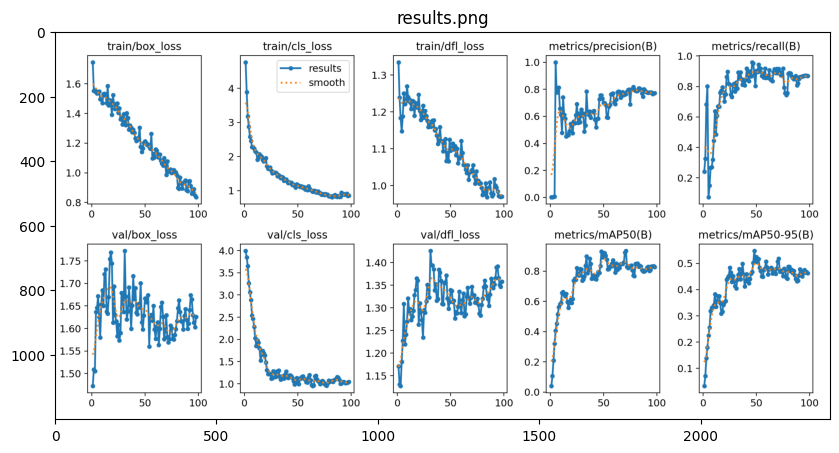

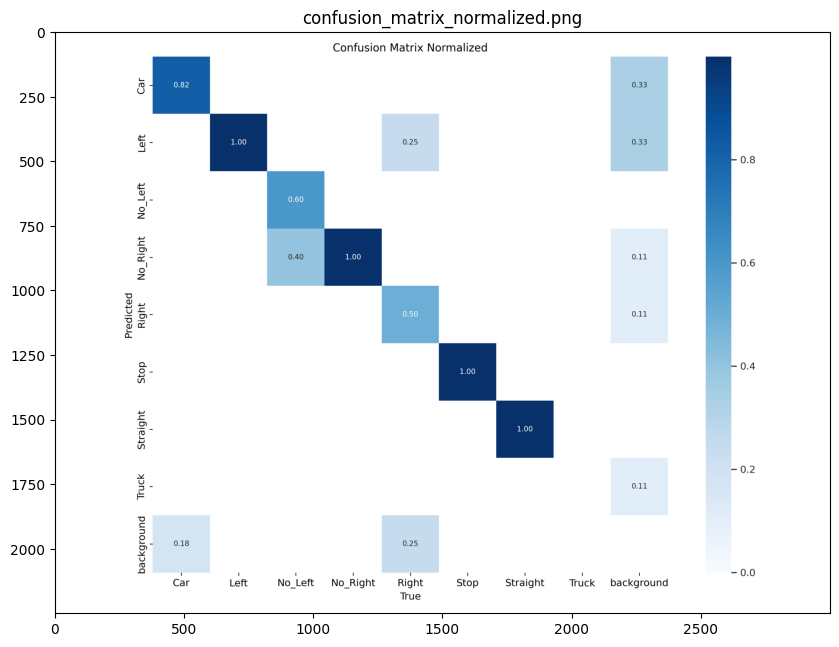

In [ ]:
image_dir = '/content/runs/detect/train2'
image_files = ['results.png', 'confusion_matrix_normalized.png']

for filename in image_files:
    img_path = os.path.join(image_dir, filename)
    if os.path.exists(img_path):
        plt.figure(figsize=(10, 10))
        img = plt.imread(img_path)
        plt.imshow(img)
        plt.title(filename)
        plt.show()
    else:
        print(f"Image not found: {filename}")

### Model Results On Some Test Images

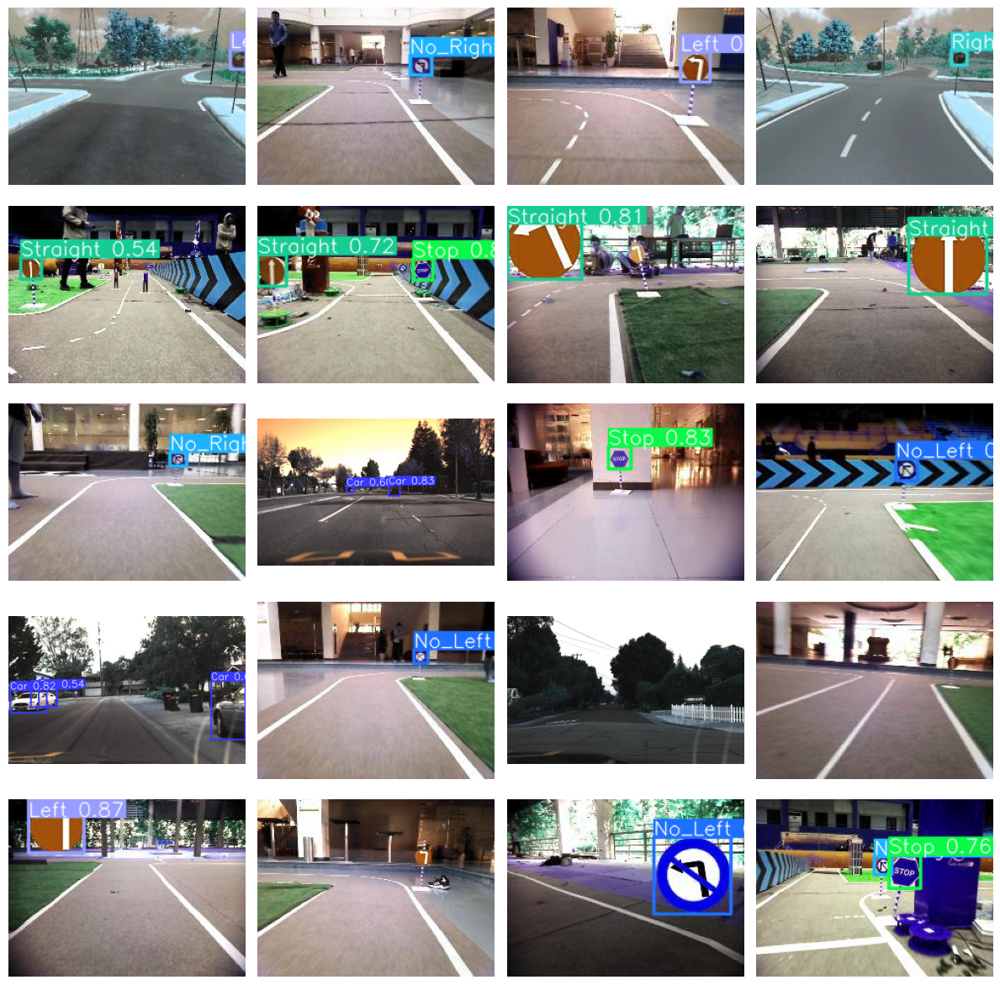

In [ ]:
model = YOLO('/content/runs/detect/train2/weights/best.pt')
test_data_path = '/content/Dataset/test/images'

test_images = []
for filename in os.listdir(test_data_path):
    img = cv2.imread(os.path.join(test_data_path, filename))
    test_images.append(img)

num_images = 20
test_images = random.sample(test_images, num_images)

fig, axes = plt.subplots(5, 4, figsize=(12, 12))

for i, img in enumerate(test_images):
    results = model.predict(source=img, verbose=False)

    row = i // 4
    col = i % 4
    axes[row, col].axis('off')
    axes[row, col].imshow(results[0].plot())

plt.tight_layout()
plt.show()

### Model Results On Test Videos For Traffic Sign Detection along with pretrained YOLOv8 for vehicle detection

In [ ]:
def process_video(video_path):
  video_capture = cv2.VideoCapture(video_path)
  frame_width = int(video_capture.get(3))
  frame_height = int(video_capture.get(4))
  output_video = cv2.VideoWriter(
      "Processed.mp4",
      cv2.VideoWriter_fourcc(*"mp4v"),
      30,
      (frame_width, frame_height),
  )

  while True:
      ret, frame = video_capture.read()
      if not ret:
          break

      model = YOLO('/content/runs/detect/train2/weights/best.pt')
      results = model.predict(source=frame, verbose=False)

      output_video.write(results[0].plot())

  video_capture.release()
  output_video.release()

In [ ]:
from moviepy.editor import VideoFileClip
from IPython.display import display

def display_video(video_path):
  clip = VideoFileClip(video_path)
  display(clip.ipython_display(width=800, verbose=False))

In [ ]:
process_video('/content/TestVideo1.mp4')
video_path = "/content/Processed.mp4"
display_video(video_path)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [ ]:
process_video('/content/TestVideo2.mp4')
video_path = "/content/Processed.mp4"
display_video(video_path)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4
